# <h1><center>HAPS-based MIMO Communication Example</center></h1>

<center><font size="5">Demonstration of Channel Model Usage</font></center>

This Jupyter Notebook illustrates how to integrate a **High Altitude Platform Station (HAPS)** using **MIMO** for communication channel modeling. We will explore map data, randomly select areas, compute user distributions, and demonstrate how beamforming and capacity calculations can be conducted with our custom environment modules.


## Imports and Basic Setup
In this cell, we import fundamental libraries such as `pandas`, `numpy`, `shapely`,
and our custom environment modules (`env.ChannelModel`, `env.MIMOconfig`, etc.).
We also set up the `Area_Distribution_Scenario` and instantiate the `Milan_Map` object,
which provides us with the spatial configuration of our environment.

In [ ]:
import pandas as pd 
import numpy as np
from shapely import wkt
from env.ChannelModel import MU_MIMO_CapacityCalculator
from env.MIMOconfig import MIMOConfig
from env.Map import Map
from env.haps_parameters import combined_data_sband
from env.small_scale_fading import SmallScaleFading
from env.path_loss import PathLossCalculator
from env.Directivity_Gain import DirectivityGainCalculator

Area_Distribution_Scenario = 0 

Milan_Map = Map(map_index=Area_Distribution_Scenario)

display(Milan_Map.areas_configurations)

Elevation: 10°
Dense Urban - LOS Probability: 28.2
Path Loss Parameters (S-band LOS σ_SF): 3.5
Urban - LOS Probability: 24.6
Path Loss Parameters (S-band NLOS CL): 34.3
Suburban/Rural - LOS Probability: 78.2
Path Loss Parameters (S-band LOS σ_SF): 1.79
-----
Elevation: 20°
Dense Urban - LOS Probability: 33.1
Path Loss Parameters (S-band LOS σ_SF): 3.4
Urban - LOS Probability: 38.6
Path Loss Parameters (S-band NLOS CL): 30.9
Suburban/Rural - LOS Probability: 86.9
Path Loss Parameters (S-band LOS σ_SF): 1.14
-----
Elevation: 30°
Dense Urban - LOS Probability: 39.8
Path Loss Parameters (S-band LOS σ_SF): 2.9
Urban - LOS Probability: 49.3
Path Loss Parameters (S-band NLOS CL): 29.0
Suburban/Rural - LOS Probability: 91.9
Path Loss Parameters (S-band LOS σ_SF): 1.14
-----
Elevation: 40°
Dense Urban - LOS Probability: 46.8
Path Loss Parameters (S-band LOS σ_SF): 3.0
Urban - LOS Probability: 61.3
Path Loss Parameters (S-band NLOS CL): 27.7
Suburban/Rural - LOS Probability: 92.9
Path Loss Param

,area_name,geometry,centroid,area_type
0,Agricultural Park,POLYGON ((1015456.3950162416 5676791.151211872...,POINT (1021173.7927088565 5680508.906881389),suburban_rural
1,Business,POLYGON ((1021245.0085374918 5696145.535600942...,POINT (1025304.0361819081 5698795.118986306),dense_urban
2,Duomo,POLYGON ((1026810.9830771554 5713536.431718657...,POINT (1032392.4922338607 5714332.379536502),dense_urban
3,FS,POLYGON ((1011894.1713108568 5695023.542303025...,POINT (1016392.527994784 5697165.905058188),dense_urban
4,Highway,POLYGON ((1020577.0915927321 5687169.589217605...,POINT (1024888.9876552548 5689208.820359964),suburban_rural
5,Industrial,POLYGON ((1004101.8069553276 5700353.010468131...,POINT (1008096.7972113773 5703211.344979261),urban
6,Linate,POLYGON ((1027033.622058742 5678193.6428342685...,POINT (1032396.4368542342 5681765.147206898),urban
7,Mediolanum Forum,POLYGON ((1014788.4780714819 5713536.431718657...,POINT (1020356.828082251 5715239.9585185675),urban
8,Monza Park,POLYGON ((1004101.8069553276 5688852.579164481...,POINT (1007974.4847244789 5692367.856553524),suburban_rural
9,Polimi,POLYGON ((1029705.2898377805 5689413.575813439...,POINT (1033443.4954104688 5692640.490082199),urban


## Plot MAP Function
This function creates a Map of the area configuration in (Milan) plot by:
- Converting our area configuration DataFrame into a GeoDataFrame (EPSG:3857).
- Plotting area boundaries and filling them with colors based on area type.
- Adding a basemap from OpenStreetMap (via Contextily).
- Labeling each area's centroid with its name/type.
- Adjusting the bounding box and forcing axis ticks at 5k intervals.

[1004101.80695533 5676791.15121187 1037497.65419331 5718865.89988376]


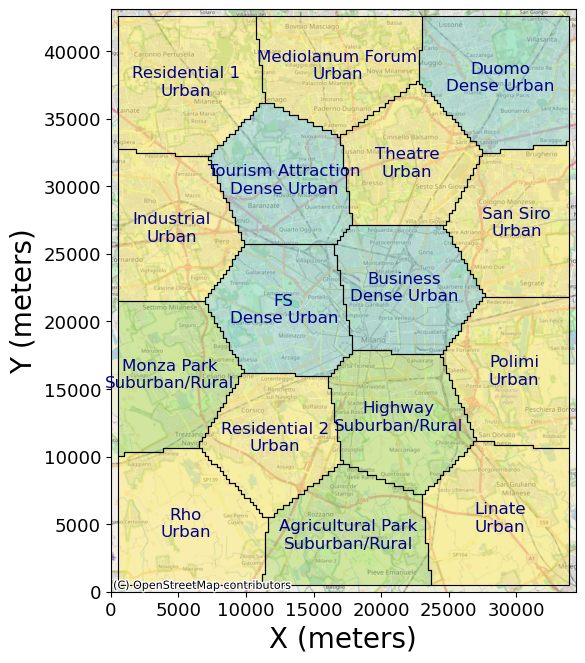

In [2]:

import geopandas as gpd
from shapely.geometry import Point



import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patches import Patch

###############################################################################
#                  HELPER: FORCE 0, 5000, 10000,... TICKS
###############################################################################
def set_5k_ticks(ax, minx, maxx, miny, maxy):
    """
    Force axis ticks labeled at 0, 5000, 10000, etc.,
    while preserving real EPSG:3857 data for the basemap.

    We do this by:
    1) computing the plot ranges,
    2) creating a list of labels [0, 5000, 10000, ...] up to that range,
    3) placing ticks at (label + minx) in the real coordinate system,
       but labeling them as the plain 'label'.
    """
    import numpy as np

    # X-axis
    x_range = maxx - minx
    x_labels = np.arange(0, x_range + 1, 5000)
    x_positions = x_labels + minx
    ax.set_xticks(x_positions)
    ax.set_xticklabels([str(int(lbl)) for lbl in x_labels], fontsize = 13)

    # Y-axis
    y_range = maxy - miny
    y_labels = np.arange(0, y_range + 1, 5000)
    y_positions = y_labels + miny
    ax.set_yticks(y_positions)
    ax.set_yticklabels([str(int(lbl)) for lbl in y_labels], fontsize = 13)



def plot_Milan_map(area_configuration=None):
    
    area_configuration_copy = area_configuration.copy()
    
    fig, ax = plt.subplots(1, 1, figsize=(6, 10))
    # Load clustered areas and remap area_type
    
    class_name_mapping = {
        'dense_urban': 'Dense Urban',
        'urban': 'Urban',
        'suburban_rural': 'Suburban/Rural'
    }
    area_configuration_copy['area_type'] = area_configuration_copy['area_type'].map(class_name_mapping).fillna('Unknown')
    
    area_configuration_copy = gpd.GeoDataFrame(area_configuration_copy, geometry='geometry', crs='EPSG:3857')

    area_configuration_copy.boundary.plot(ax=ax, edgecolor='black', linewidth=0.8)
    cmap = 'Set3'
    area_configuration_copy.plot(ax=ax, column='area_type', legend=False, cmap=cmap, alpha=0.5)

    # Basemap
    ctx.add_basemap(ax, crs=area_configuration_copy.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)


    # Label centroids
    for idx, row in area_configuration_copy.iterrows():
        centroid = row['centroid']
        area_name = row['area_name']
        ax.text(centroid.x, centroid.y, f"{area_name}\n{row['area_type']}",
                fontsize=12, ha='center', va='center', color='darkblue')


    # Determine bounding box (all polygons + HAPS)
    all_bounds = gpd.GeoSeries(
        area_configuration_copy.geometry
    ).total_bounds
    minx, miny, maxx, maxy = all_bounds
    print(all_bounds)
    # Add padding
    padding = 500
    ax.set_xlim(minx - padding, maxx + padding)
    ax.set_ylim(miny - padding, maxy + padding)

    # Force axis ticks at 0, 5000, 10000, etc.
    set_5k_ticks(ax, minx - padding, maxx + padding, miny - padding, maxy + padding)

   
    ax.set_xlabel("X (meters)", fontsize = 20)
    ax.set_ylabel("Y (meters)", fontsize = 20)
    plt.subplots_adjust(wspace=0.4, hspace=0.6)
    #plt.savefig('meeting/r_map_0.pdf', bbox_inches='tight', pad_inches=0.2, dpi=300)
    plt.show()

plot_Milan_map(Milan_Map.areas_configurations)



## Area-Specific Probabilities
We define two dictionaries:
- `area_indoor_probabilities`: Probability of a user being indoors in each area.
- `area_traditional_building_probability`: Probability of having a traditional building in each area.

These will be used later to characterize user distribution scenarios.

These probabilities are based on the area type and are used to simulate user behavior in the environment.


In [3]:
area_indoor_probabilities = {
    'Agricultural Park': 0.9,
    'Business': 0.5,
    'Duomo': 0.6,
    'FS': 0.6,
    'Highway': 0.9,
    'Industrial': 0.4,
    'Linate': 0.3,
    'Mediolanum Forum': 0.6,
    'Monza Park': 0.9,
    'Polimi': 0.5,
    'Residential 1': 0.7,
    'Residential 2': 0.7,
    'Rho': 0.6,
    'San Siro': 0.6,
    'Theatre': 0.6,
    'Tourism Attraction': 0.6
} 


area_traditional_building_probability = {
    'Agricultural Park': 0.9,
    'Business': 0.5,
    'Duomo': 0.6,
    'FS': 0.6,
    'Highway': 0.9,
    'Industrial': 0.4,
    'Linate': 0.3,
    'Mediolanum Forum': 0.6,
    'Monza Park': 0.9,
    'Polimi': 0.5,
    'Residential 1': 0.7,
    'Residential 2': 0.7,
    'Rho': 0.6,
    'San Siro': 0.6,
    'Theatre': 0.6,
    'Tourism Attraction': 0.6
}



## Randomly Selecting Areas
We randomly pick `M` areas (from the total in `Milan_Map`), 
and gather their names, indoor probabilities, building probabilities, 
boundaries, centroids, and area types. 
We then also retrieve the overall map boundaries.

In [4]:
import random   
M = 5
number_of_area = len(Milan_Map)
selected_areas_indexes = random.sample(range(number_of_area), M)
selected_areas_names = Milan_Map[selected_areas_indexes].area_name.to_list()

selected_areas_user_indoor_probabilities = []
selected_areas_traditional_building_probabilities = []
for area_name in selected_areas_names:
    selected_areas_user_indoor_probabilities.append(area_indoor_probabilities[area_name])
    selected_areas_traditional_building_probabilities.append(area_traditional_building_probability[area_name])
    
    
selected_areas_boundaries = Milan_Map[selected_areas_indexes].geometry.to_list()
selected_areas_centroids = Milan_Map[selected_areas_indexes].centroid.to_list()
selected_areas_area_types = Milan_Map[selected_areas_indexes].area_type.to_list()

Map_boundaries = Milan_Map.Get_Map_Bounds()
print(Map_boundaries)

[1004101.80695533 5676791.15121187 1037497.65419331 5718865.89988376]


## Normalization and HAPS Position
Here we shift the selected areas so that (x_min, y_min) = (0, 0),
calculating new boundaries and centroids. 
Then we randomly pick a `haps_position` within the normalized map extents.

In [5]:
from shapely.affinity import translate  # Shapely for shifting geometry

# --- Offsets to normalize to (0,0) ---
x_offset = Map_boundaries[0]  # x_min
y_offset = Map_boundaries[1]  # y_min


# --- Normalize HAPS/Map Boundaries---
normalized_map_boundaries = [
    Map_boundaries[0] - x_offset,  # x_min
    Map_boundaries[1] - y_offset,  # y_min
    Map_boundaries[2] - x_offset,  # x_max
    Map_boundaries[3] - y_offset   # y_max
]

# --- Normalize selected areas’ boundaries ---
normalized_areas_boundaries = []
for boundary in selected_areas_boundaries:
    # Shift each polygon so (x_min, y_min) is now (0,0)
    shifted_boundary = translate(boundary, xoff=-x_offset, yoff=-y_offset)
    normalized_areas_boundaries.append(shifted_boundary)

# --- Normalize selected areas’ centroids ---
normalized_areas_centroids = []
for centroid in selected_areas_centroids:
    # Shift each centroid likewise
    shifted_centroid = translate(centroid, xoff=-x_offset, yoff=-y_offset)
    normalized_areas_centroids.append(shifted_centroid)

# --- Generate random HAPS position within the normalized map bounds ---
map_width = Map_boundaries[2] - Map_boundaries[0]  # (x_max - x_min)
map_height = Map_boundaries[3] - Map_boundaries[1] # (y_max - y_min)

haps_x = random.uniform(0, map_width)
haps_y = random.uniform(0, map_height)
haps_position = (haps_x, haps_y)

# For illustration:
print("Normalized Boundaries:", normalized_areas_boundaries)
print("Normalized Centroids:", normalized_areas_centroids)
print("Random HAPS position:", haps_position)

Normalized Boundaries: [<POLYGON ((0 12061.428, 0 12341.926, 0 12622.425, 0 12902.923, 0 13183.421, ...>, <POLYGON ((0 33098.802, 0 33379.301, 0 33659.799, 0 33940.297, 0 34220.796, ...>, <POLYGON ((16475.285 10378.438, 16475.285 10658.936, 16252.646 10658.936, 16...>, <POLYGON ((0 23561.859, 0 23842.358, 0 24122.856, 0 24403.354, 0 24683.853, ...>, <POLYGON ((10686.671 36745.281, 10686.671 37025.779, 10686.671 37306.277, 10...>]
Normalized Centroids: [<POINT (3872.678 15576.705)>, <POINT (5037.984 37216.347)>, <POINT (20787.181 12417.669)>, <POINT (3994.99 26420.194)>, <POINT (16255.021 38448.807)>]
Random HAPS position: (30875.106077272656, 11510.613745393246)


## Building the `area_parameters` List
We loop over each selected area, storing critical information:
- Name, type, boundary, centroid, altitude, and more.
- We compute the elevation angle to the HAPS at 20 km altitude.
- We also find the S-Band data entry whose elevation is closest to our computed angle.
Finally, we store everything in `area_parameters`.


In order to run the method `Haps_channel_MU_MIMO.generate_capacities( .... )` which will be later used to calculate the capacities for the MU-MIMO channel, we need to create a `area_parameters` List.

In [10]:
import numpy as np

# List to store parameters for each selected area
area_parameters = []


##This variable is intended for Monte Carlo simulations where the channel quality for every beam
##is calculated based on the average throughput of all users in the beam. A higher number of users 
##per area results in a more accurate channel estimation.
Number_users_per_beam = 500

for i, (area_name, area_type, indoor_prob, building_prob, boundary, centroid) in enumerate(
    zip(
        selected_areas_names,
        selected_areas_area_types,
        selected_areas_user_indoor_probabilities,
        selected_areas_traditional_building_probabilities,
        normalized_areas_boundaries,
        normalized_areas_centroids
    )
):
    # Initialize a dict for this area
    area_dict = {}
    
    # Basic info
    area_dict["area_name"] = area_name
    area_dict["area_type"] = area_type
    area_dict["indoor_percentage"] = indoor_prob
    area_dict["traditional_building_percentage"] = building_prob
    area_dict["boundary"] = boundary  # Shapely Polygon (already normalized)
    area_dict["beam_radius"] = Milan_Map.get_max_distance_by_index(selected_areas_indexes[i])
    # Convert centroid to a tuple (x, y, z=0).
    # If 'centroid' is a Shapely Point, we can do centroid.x, centroid.y.
    # If it's already a tuple, just use centroid[0], centroid[1].
    area_centroid = (centroid.x, centroid.y, 0)
    area_dict["area_centroid"] = area_centroid  # Storing the 3D coords
    
    # Set the altitude for the HAPS (z=20,000 as an example)
    haps_altitude = MIMOConfig.H
    haps_coordinate = (haps_position[0], haps_position[1], haps_altitude)
    
    # Compute horizontal distance in X-Y plane
    horizontal_distance = np.sqrt(
        (haps_coordinate[0] - area_centroid[0])**2 +
        (haps_coordinate[1] - area_centroid[1])**2
    )
    
    # Height difference
    height_difference = haps_coordinate[2] - area_centroid[2]
    
    # Calculate elevation angle (degrees)
    elevation_angle_rad = np.arctan2(height_difference, horizontal_distance)
    elevation_angle_deg = np.degrees(elevation_angle_rad)
    area_dict["elevation_angle_deg"] = elevation_angle_deg
    
    ##This  is intended for Monte Carlo simulations where the channel quality for every beam
    ##is calculated based on the average throughput of all users in the beam. A higher number of users 
    ##per area results in a more accurate channel estimation.

    area_dict["N_users"] = 500
        
    # Find the dataset entry whose elevation is closest to this angle
    # (Requires 'combined_data_sband' to be defined)
    closest_data = min(
        combined_data_sband.data,
        key=lambda d: abs(d.elevation - elevation_angle_deg)
    )
    area_dict["SBAND_data"] = closest_data
    
    # Finally, append this dictionary to the area parameters list
    area_parameters.append(area_dict)

# Optional: print or inspect the results
print("Final area parameters:")
for ap in area_parameters:
    print(ap)


Final area parameters:
{'area_name': 'Monza Park', 'area_type': 'suburban_rural', 'indoor_percentage': 0.9, 'traditional_building_percentage': 0.9, 'boundary': <POLYGON ((0 12061.428, 0 12341.926, 0 12622.425, 0 12902.923, 0 13183.421, ...>, 'beam_radius': 7174.702910727597, 'area_centroid': (3872.6777691512834, 15576.705341652036, 0), 'elevation_angle_deg': 36.21967647252731, 'N_users': 500, 'SBAND_data': ElevationDataSBand(elevation=40, dense_urban=ScenarioDataSBand(los_probability=46.8, path_loss=PathLossParametersSBand(los_sf=3.0, nlos_sf=11.7, nlos_cl=27.7)), urban=ScenarioDataSBand(los_probability=61.3, path_loss=PathLossParametersSBand(los_sf=4, nlos_sf=6, nlos_cl=27.7)), suburban_rural=ScenarioDataSBand(los_probability=92.9, path_loss=PathLossParametersSBand(los_sf=0.92, nlos_sf=10.25, nlos_cl=18.28)))}
{'area_name': 'Residential 1', 'area_type': 'urban', 'indoor_percentage': 0.7, 'traditional_building_percentage': 0.7, 'boundary': <POLYGON ((0 33098.802, 0 33379.301, 0 33659.7

## Final Plot with HAPS on Selected Areas
Finally, we:
1. Define a helper function `generate_heatmap` that includes the HAPS point.
2. Pass the *unnormalized* HAPS position to show it on the chosen subset of areas (`selected_areas_indexes`).
3. Display the resulting map with the red HAPS marker.

combined bounds: [1004101.80695533 5683523.11099937 1034976.9130326  5718865.89988376]


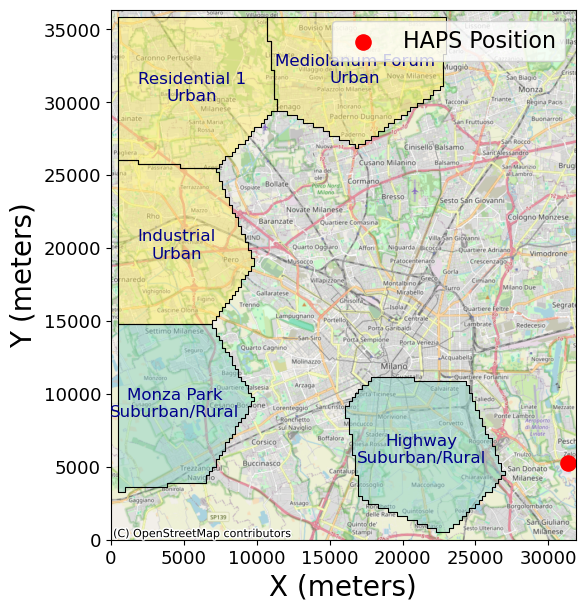

In [7]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from shapely import wkt
import numpy as np
from sklearn.neighbors import KernelDensity
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.patches import Patch

###############################################################################
#                  HELPER: FORCE 0, 5000, 10000,... TICKS
###############################################################################
def set_5k_ticks(ax, minx, maxx, miny, maxy):
    """
    Force axis ticks labeled at 0, 5000, 10000, etc.,
    while preserving real EPSG:3857 data for the basemap.

    We do this by:
    1) computing the plot ranges,
    2) creating a list of labels [0, 5000, 10000, ...] up to that range,
    3) placing ticks at (label + minx) in the real coordinate system,
       but labeling them as the plain 'label'.
    """
    import numpy as np

    # X-axis
    x_range = maxx - minx
    x_labels = np.arange(0, x_range + 1, 5000)
    x_positions = x_labels + minx
    ax.set_xticks(x_positions)
    ax.set_xticklabels([str(int(lbl)) for lbl in x_labels], fontsize = 13)

    # Y-axis
    y_range = maxy - miny
    y_labels = np.arange(0, y_range + 1, 5000)
    y_positions = y_labels + miny
    ax.set_yticks(y_positions)
    ax.set_yticklabels([str(int(lbl)) for lbl in y_labels], fontsize = 13)



def generate_heatmap(selected_area_configuration, haps_position):
    area_configuration_copy = selected_area_configuration.copy()
    
    fig, ax = plt.subplots(1, 1, figsize=(6, 10))
    # Map area_type to readable form
    class_name_mapping = {
        'dense_urban': 'Dense Urban',
        'urban': 'Urban',
        'suburban_rural': 'Suburban/Rural'
    }
    area_configuration_copy['area_type'] = area_configuration_copy['area_type'].map(class_name_mapping).fillna('Unknown')
    
    # Convert to GeoDataFrame
    area_configuration_copy = gpd.GeoDataFrame(area_configuration_copy, geometry='geometry', crs='EPSG:3857')

    # Plot boundaries & fill
    area_configuration_copy.boundary.plot(ax=ax, edgecolor='black', linewidth=0.8)
    area_configuration_copy.plot(ax=ax, column='area_type', legend=False, cmap='Set3', alpha=0.5)

    # Basemap
    ctx.add_basemap(ax, crs=area_configuration_copy.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

    # Create the HAPS point
    x_val, y_val = haps_position
    haps_point = Point(x_val, y_val)
    haps_gdf = gpd.GeoDataFrame(geometry=[haps_point], crs='EPSG:3857')
    
    # Plot the HAPS point
    haps_gdf.plot(ax=ax, color='red', markersize=120, alpha=1.0, label='HAPS Position')

    # Label area centroids
    for idx, row in area_configuration_copy.iterrows():
        centroid = row['centroid']
        area_name = row['area_name']
        ax.text(
            centroid.x, centroid.y, f"{area_name}\n{row['area_type']}",
            fontsize=12, ha='center', va='center', color='darkblue'
        )

    # -------- Ensure bounding box includes polygons AND the HAPS point ----------
    combined = gpd.GeoSeries(list(area_configuration_copy.geometry) + [haps_point])
    all_bounds = combined.total_bounds  # includes the point
    minx, miny, maxx, maxy = all_bounds
    print("combined bounds:", all_bounds)
    padding = 500
    ax.set_xlim(minx - padding, maxx + padding)
    ax.set_ylim(miny - padding, maxy + padding)

    # Force axis ticks at increments of 5k
    set_5k_ticks(ax, minx - padding, maxx + padding, miny - padding, maxy + padding)

    ax.set_xlabel("X (meters)", fontsize=20)
    ax.set_ylabel("Y (meters)", fontsize=20)
    plt.subplots_adjust(wspace=0.4, hspace=0.6)
    
    # Show legend and final plot
    ax.legend(fontsize=16, loc='upper right')
    plt.show()


## we fix haps position (unnormalized) to be the same as the one used in the map
haps_position_unormalized = (haps_position[0] + x_offset, haps_position[1] + y_offset)

generate_heatmap(Milan_Map.areas_configurations.loc[selected_areas_indexes], haps_position_unormalized)



## Setting Up MU-MIMO Channel Calculator
We create a `MU_MIMO_CapacityCalculator` object with the relevant submodules:
- Small-scale fading model
- Path loss calculator
- Directivity gain calculator
- Noise power, system bandwidth, etc.

In [8]:
total_number_of_antennas = MIMOConfig.N_x * MIMOConfig.N_y
Haps_channel_MU_MIMO = MU_MIMO_CapacityCalculator(SmallScaleFading(total_number_of_antennas,1,0.15)
                                                  , PathLossCalculator(MIMOConfig.f),DirectivityGainCalculator(MIMOConfig.H,MIMOConfig.eta), 
                                                  MIMOConfig.P_n, 
                                                  MIMOConfig.B, 
                                                  MIMOConfig.N_x, 
                                                  MIMOConfig.N_y, normalized_map_boundaries)

In [11]:

capacities=Haps_channel_MU_MIMO.generate_capacities(area_parameters,haps_coordinate, M,plot=  True)

print("Beam Capacities:\n----------------")
for i, capacity in enumerate(capacities):
    area_name = area_parameters[i]["area_name"]
    print(f"Beam {i+1} covers '{area_name}' with capacity: {capacity:.2f} Mbps")

Beam Capacities:
----------------
Beam 1 covers 'Monza Park' with capacity: 23.01 Mbps
Beam 2 covers 'Residential 1' with capacity: 2.10 Mbps
Beam 3 covers 'Highway' with capacity: 37.34 Mbps
Beam 4 covers 'Industrial' with capacity: 14.13 Mbps
Beam 5 covers 'Mediolanum Forum' with capacity: 4.32 Mbps
